# Notebook 3: Crawler/Classifier

**Overview:** The crawler samples points over our sampling region (the bounding box defined in the first notebook), and the classifier performs segmentations (using the model we trained in the second notebook) and postprocesses them into the final map.

In [4]:
import json
import gc
import math
import time
import numpy as np
import pandas as pd
import geopandas as gpd, GeoDataFrame
import folium
from shapely.geometry import box, LineString, MultiLineString, Polygon, mapping

from matplotlib import pyplot as plt
from matplotlib import patches
import cv2

from constants import *
from streetview_query_functions import *
from map_common import *
from model_common import *

## 1. Crawler

First, we load the previously-generated raw road geometry database from OpenStreetMap (which we've already used in Notebook 1).

In [5]:
road_geo_gdf = gpd.read_file(ROAD_GEOMETRY_FILENAME).to_crs(epsg=4326)

For reference, we can plot the raw road geometry map.

In [ ]:
road_geometry_map = folium.Map(OAKLAND_COORDS, zoom_start=12)
folium.GeoJson(road_geo_gdf[["geometry"]]).add_to(road_geometry_map)
road_geometry_map

Now, we can load the bounding box to a Shapely object, then filter the road geometry dataframe to only include data within that region.

In [6]:
BBOX = box(*np.flip(BOTTOM_LEFT), *np.flip(TOP_RIGHT))
road_geo_gdf_clipped = road_geo_gdf[road_geo_gdf.intersects(BBOX)]

Again, for reference, we can plot the bounding box. I've put it in red to make it a bit clearer.

In [ ]:
road_geometry_map_clipped = folium.Map(BOUNDARY_CENTER, zoom_start=16)

# we can define a geodataframe specifically for 
# the bounding box to make plotting easier later
bbox_gdf = gpd.GeoDataFrame(geometry=[BBOX], crs="EPSG:4326")

# then we add the previous clipped road geometry
folium.GeoJson(road_geo_gdf_clipped[["geometry"]]).add_to(road_geometry_map_clipped)

# and plot the bounding box
folium.GeoJson(
    bbox_gdf, style_function=lambda x: {
        'fill': False,
        'color': 'red',
        'weight': 2
    }
).add_to(road_geometry_map_clipped)

# now we can show the current map
road_geometry_map_clipped

Next, we're going to sample points within the bounding box to perform the segmentation on, and to do so, this is going to require a few functions. 

First, we can define a function to sample points along a line based on some spacing parameter in meters:

In [ ]:
def sample_points_along_line(line, spacing):
    """
    Obtains equally-spaced points along a line
    according to a spacing in meters.
    """
    points = []
    
    if isinstance(line, MultiLineString):
        for part in line:
            points.extend(sample_points_along_line(part, spacing))
        return points
    
    length = line.length
    
    # distances along the line
    distances = np.arange(0, length, spacing)
    
    return [(line.interpolate(d), line, d) for d in distances]

Then, we can apply this sampling function to all of the roads in our clipped GeoDataFrame to produce the sampled points. 

In [4]:
def sample_roads(gdf, spacing):
    """
    Samples all of the roads in the GeoDataFrame
    for evenly-spaced points to query for images
    from.
    """
    # We have to ensure that this is in a projected CRS (working in meters, not latitude/longitude)
    # to ensure that the distance computations are still valid.
    if not gdf.crs.is_projected:
        raise ValueError('Road Geometry GeoDataFrame is not in UTM CRS. Project it to UTM CRS first!')
    
    records = []

    # For each road-line (geom) of the dataframe,
    for idx, geom in enumerate(gdf.geometry):
        
        # We run the sampler for that road-line
        pts = sample_points_along_line(geom, spacing)

        # Then we append all of the points with their data
        for point, line, dist in pts:
            records.append({
                "geometry": point,
                "road_geom": line,
                "road_id": idx,
                "distance": dist
            })
    
    # then we convert back to the original CRS
    points_projected = gpd.GeoDataFrame(records, crs=gdf.crs)
    
    # additionally, we remove the intersections to make future segmentations easier
    intersection_mask = points_projected.geometry.apply(make_intersection_checker(gdf, 10))
    points_projected_filtered = points_projected[~intersection_mask]
    print(f'Filtered {intersection_mask.sum()} intersection points.')
    
    # and then we convert the final filtered dataframe back to lat, lon CRS
    return points_projected_filtered.to_crs(epsg=4326)

And now we can test this out with our previous clipped GeoDataFrame.

In [5]:
# This is somewhat arbitrary, but we choose to sample every 30 meters.
# Any value between 10-50 meters would probably work, but this would
# alter the volume of data we'd recieve.
SPACING_BETWEEN_SAMPLING_POINTS = 30

road_geo_gdf_clipped_projected = road_geo_gdf_clipped.to_crs(road_geo_gdf_clipped.estimate_utm_crs())
crawled_points_gdf = sample_roads(road_geo_gdf_clipped_projected, SPACING_BETWEEN_SAMPLING_POINTS)

Filtered 32 intersection points.


Now, for reference, we can plot these points to the previous map to see what we're working with:

In [6]:
crawled_points_map = folium.Map(location=BOUNDARY_CENTER, zoom_start=16)

# drawing the bounding box
folium.GeoJson(
    bbox_gdf, style_function=lambda x: {
        'fill': False,
        'color': 'red',
        'weight': 2
    }
).add_to(crawled_points_map)

# plotting all of the points
for _, row in crawled_points_gdf.iterrows():
    folium.CircleMarker(
        location=(row.geometry.y, row.geometry.x),
        radius=0.1,
        color="blue",
        fill=True,
        fill_opacity=0.3
    ).add_to(crawled_points_map)
    
crawled_points_map

As you can see, we now have a map of sampling points across roads that we can use! Now, we can move on to the classifier to perform segmentations onto these points.

## 2. Classifier

Before being able to segment these points, we'll need to obtain perspective imagery from each point in the same manner as we did in notebook 1. To demonstrate how this works, we can start by just taking an arbitrary point from the points we've taken alongside the road that it comes from:

In [33]:
example_row = crawled_points_gdf.sample(n=1).iloc[0]
example_point = example_row.geometry
example_point_road = example_row.road_geom

Then, we can use the function defined previously in `streetview_query_functions.py` to compute the principal directions for this point:

example_point_principal_directions, _ = compute_tangent_angles(
    example_point_road,
    example_point_road.interpolate(example_row.distance),
    example_point_road.length / 32
)

And here, we can print them:

In [34]:
print('Obtained Point ::', example_point)
print(f'Principal Directions: {example_point_principal_directions} deg')

Obtained Point :: POINT (-122.28312238444792 37.811440549318796)
Principal Directions: [ 16 106 196 286] deg


As shown before, these principal directions are the two perpendicular and parallel directions to the roadway. For example, we can see what one of them looks like by querying an arbitrary direction out of the four.

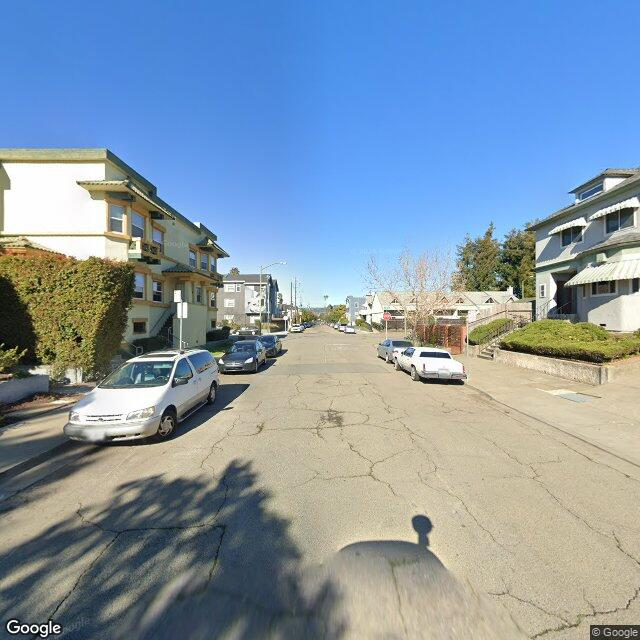

In [35]:
example_image = query_streetview_point(example_point, example_point_principal_directions[0])
example_image

Now, to perform segmentations, we can load the previously trained model (from notebook 2).

In [36]:
from transformers import pipeline

if not os.path.exists('model-output/best_model'):
    raise Exception('No trained model found.')

segmentation_model = pipeline(
    "image-segmentation",
    model="model-output/best_model",
)

Device set to use cpu


As seen in notebook 2, segmenting an image is actually an incredibly simple process with HuggingFace. All we have to do is call it as follows:

In [ ]:
results = segmentation_model(example_image)

Then, we can plot the results using the same functions used in notebook 2.

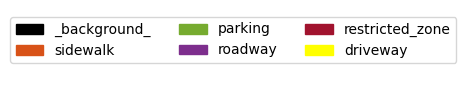

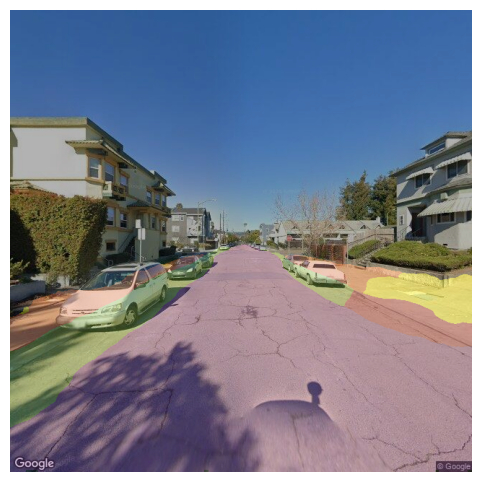

In [37]:
example_image_array = np.array(example_image)
segmentation_map = np.zeros_like(example_image_array)

for result in results:
    append_mask_to_segmentation_map(segmentation_map, result['mask'], result['label'])
    
plot_segmentation_map_over_image(example_image_array, segmentation_map)

And this is how we can segment each of the images. Now, we just need to convert these image-space masks into GPS-polygons.

## 2.2 Homographic Transform

First, we need to select the `parking` and `restricted_zone` classes from each segmented image. We can show what this looks like on our previous example image here:

In [ ]:
# we're going to want to plot everything at the end, so 
# this serves as the overlay mask to plot over the image
filtered_segmentation_map = np.zeros_like(example_image_array) 

First, we need to get the labels:

In [ ]:
# first, we grab the label for parking
parking_id=label2id['parking']

# and we can do the same thing for the restricted zone data
restricted_zone_id = label2id['restricted_zone']

Then, using those labels, we have to locate the data from the segmentation results

In [ ]:
# then, we grab the segmentation data associated with that label
parking_class_search_filter = lambda class_result: class_result['label'] == 'parking', results)
parking_class_result = next(filter(parking_class_search_filter, None)
if parking_class_result is None:
    raise ValueErrror('No parking detected in image.')

# then grabbing the segmentation data associated with that label
restricted_class_search_filter = filter(lambda class_result: class_result['label'] == 'restricted_zone', results)
restricted_class_result = next(restricted_class_search_filter, None)

And then we can select the binaries we want from that data and add it to the filtered mask to see everything later.

In [ ]:
# then, we obtain the binary mask for the parking class from that data
binary = np.asarray(parking_class_result['mask'])

# and this binary can be appended to the segmentation map
append_mask_to_segmentation_map(filtered_segmentation_map, binary, 'parking')

# its more unlikely that there is no data associated with this class, 
# so we can assume that there won't be any restricted zones in the image
restricted_binary = None

# but if there is, then we obtain the binary and add it to the image
if restricted_class_result is not None:
    restricted_binary = np.asarray(restricted_class_result['mask'])
    append_mask_to_segmentation_map(filtered_segmentation_map, restricted_binary, 'restricted_zone')
else:
    print('No restricted zone found')

Lastly, we can plot the final mask over the original image to see our selected classes.

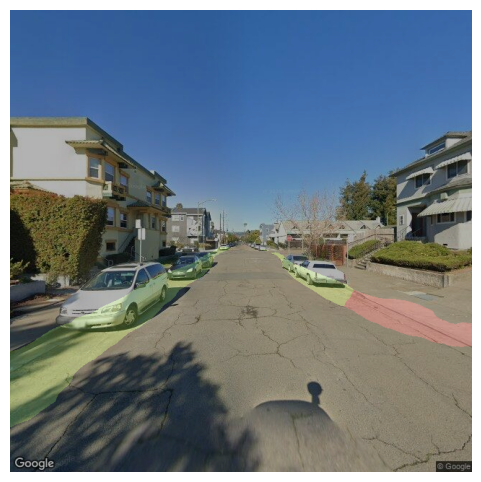

In [39]:
# and now, we can plot all of the data
plot_segmentation_map_over_image(example_image_array, filtered_segmentation_map, legend=False)

Next, we need to simplify these masks, as right now, they are just essentially simple binary masks that map a value to each pixel in the image (like a mapping $(x,y) \to c$ that maps each pixel $(x,y)$ to a class value $c$), and this is basically useless to us, as we actually just want polygons with defined vertices that we can perform useful linear algebra operations on.

To do this polygonization, we start by obtaining a list of contours for the masks using `cv2.findContours`.

In [40]:
contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
restricted_contours, _ = cv2.findContours(restricted_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

For reference, we can plot these contours to see how we've simplified these boundaries:

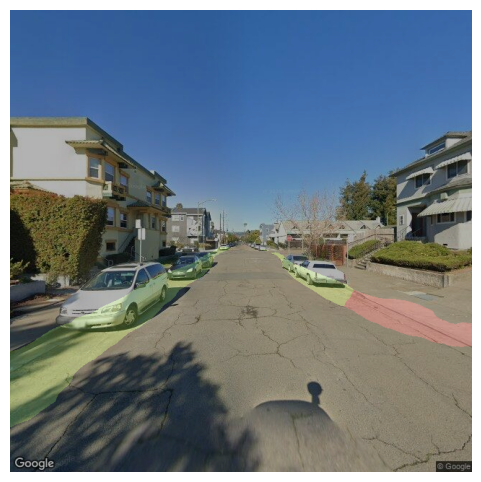

In [41]:
contour_overlay = np.zeros_like(example_image_array)
cv2.drawContours(contour_overlay, contours, -1, color=palette[parking_id], thickness=-1)
cv2.drawContours(contour_overlay, restricted_contours, -1, color=palette[restricted_zone_id], thickness=-1)
plot_segmentation_map_over_image(example_image_array, contour_overlay, legend=False)

And we can actually go a bit further and simplify this more using `cv2.approxPolyDP` (and we want to do this, as the less vertices, the better).

In [42]:
def simplify_polygons(contours, epsilon_scale=0.01):
    """
    Simplify OpenCV contours into polygon vertex arrays.
    """
    simplified = []

    for cnt in contours:
        if len(cnt) < 3:
            continue

        epsilon = epsilon_scale * cv2.arcLength(cnt, True)
        approx = cv2.approxPolyDP(cnt, epsilon, True)

        if len(approx) >= 3:
            simplified.append(approx.squeeze())

    return simplified

And we can apply this to both of the classes

In [43]:
simplified_contours = simplify_polygons(contours)
simplified_contours_restricted = simplify_polygons(restricted_contours)

And again, for reference, we can show what these final simplified contours actually look like:

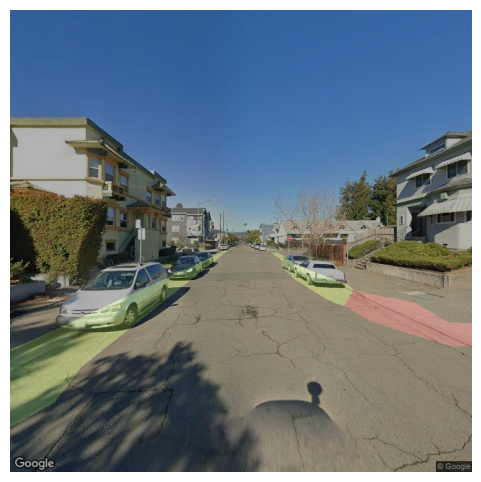

In [44]:
simplified_contour_overlay = np.zeros_like(example_image_array)
cv2.drawContours(simplified_contour_overlay, simplified_contours, -1, color=palette[parking_id], thickness=-1)
cv2.drawContours(simplified_contour_overlay, simplified_contours_restricted, -1, color=palette[restricted_zone_id], thickness=-1)
plot_segmentation_map_over_image(example_image_array, simplified_contour_overlay, legend=False)

Overally, it's incredibly simple compared to what we started with, but that makes performing the homographic transform, the next part, incredibly simple. To do the transform, we first have to start by building the camera model.

In [45]:
import cameratransform as ct

so = ct.SpatialOrientation(
    # Cameras are estimated to be about 2.5 meters (8.3 feet) high.
    elevation_m=2.5,
    
    # The heading is just directly what we put in.
    heading_deg=example_point_principal_directions[0],
    
    # Each image has a preset, defined tilt at 90 degrees.
    tilt_deg=90
)

proj = ct.RectilinearProjection(
    # The x-FOV is 60 degrees
    view_x_deg=60,
    
    # Then, we just feed in the image
    image=np.asarray(example_image)
)

camera = ct.Camera(proj, so)

# And we set the GPS position to that of the image sampling point
camera.setGPSpos(example_point.y, example_point.x)

Now, in applying the transform, we'll need to setup a few functions to make things simpler. First, we need to ensure that the polygons we developed earlier are actually fully closed (and this is incredibly important to building the final GPS polygon):

In [ ]:
def ensure_safe_polygon(coords):
    coords = list(coords)

    if len(coords) < 3:
        return None

    # force closure safely
    if np.array_equal(coords[0], coords[-1]):
        coords.append(coords[0])

    try:
        poly = Polygon(coords)

        if poly.is_empty:
            return None

        # fix self-intersections if any
        poly = poly.buffer(0)

        if not poly.is_valid:
            return None

        return poly

    except Exception as e:
        print("Polygon error:", e)
        return None

Then, we need a function that converts each polygon from image space to GPS space:

In [ ]:
def img_polygon_to_gps_polygon(camera, polygon):
    gps_coords = []

    for coord in polygon:
        lat, lon = camera.gpsFromImage(coord).flatten()[0:2]
        gps_coords.append((lon, lat))

    return ensure_safe_polygon(gps_coords)

Then, we'll have a function that clips any transformed polygons within a set radius of the camera's polygon (to prevent the problem of farther transforms being more inaccurate).

In [ ]:
def clip_within_buffer(camera, gdf, radius) -> GeoDataFrame:
    """
    Clips the polygons within a buffer.
    """
    camera_point = gpd.GeoSeries([Point(camera.gps_lon, camera.gps_lat)], crs="EPSG:4326")

    # project to metric
    camera_point_m = camera_point.to_crs(camera_point.estimate_utm_crs())
    gdf_m = gdf.to_crs(camera_point_m.crs)

    # build buffer
    buffer = camera_point_m.buffer(radius).iloc[0]

    # clip polygons
    clipped = gdf_m[gdf_m.intersects(buffer)].copy()
    clipped["geometry"] = clipped["geometry"].intersection(buffer)

    # convert back to lat, lon
    clipped_gps = clipped.to_crs("EPSG:4326")
    
    return clipped_gps

And then, we can combine all of this together to make this a simple conversion function for all of our data.

In [11]:
def img_polygons_to_gps(camera, polygons, radius=30) -> GeoDataFrame:
    """
    Convert many image-space polygons to GPS polygons.
    
    Default clip of 30 meter radius.
    """
    gps_polygons = []

    for poly in polygons:
        gps_poly = img_polygon_to_gps_polygon(camera, poly)
        
        if gps_poly is not None:
            gps_polygons.append(gps_poly)
            
    gdf = gpd.GeoDataFrame(geometry=gps_polygons, crs="EPSG:4326")

    return clip_within_buffer(camera, gdf, radius)

Now, we can apply it to the simplified data from before

In [48]:
parking_gps_polygons = img_polygons_to_gps(camera, simplified_contours)
parking_gps_polygons['class'] = 'parking'
restricted_gps_polygons = img_polygons_to_gps(camera, simplified_contours_restricted)
restricted_gps_polygons['class'] = 'restricted_zone'

And lastly, we can plot these transformed points

In [49]:
import folium

# Create map centered at the camera
example_point_pos = [example_point.y, example_point.x]
example_image_map = folium.Map(location=example_point_pos, zoom_start=18)
folium.Marker(location=example_point_pos, popup=f"Camera Position").add_to(example_image_map)
plot_to_map(parking_gps_polygons, restricted_gps_polygons, m=example_image_map)

# Display map
example_image_map

And now, believe it or not, this is the same data from before transformed from image space to GPS space. Now, all that is left is to apply this all over the data region.

## 2.3 Application Across the Region

Now, all of this is just following the process outlined previously with the example image and standardizing the process.

In [ ]:
def extract_class_boundaries(prediction, camera, class_name) -> GeoDataFrame or None:
    """
    Extracts the boundaries for a given class as a GeoDataFrame (or None)
    """
    parking_result = next((class_result for class_result in prediction \
                            if class_result["label"] == class_name), None)
    if parking_result is None:
        return None

    binary = np.asarray(parking_result["mask"]).astype(np.uint8)
    
    # extract/simplify polygons
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    simplified_contours = simplify_polygons(contours)

    if len(simplified_contours) == 0:
        return None

    # camera
    camera.orientation.heading_deg = theta

    # image -> gps
    gdf = img_polygons_to_gps(camera, simplified_contours)
    gdf['class'] = class_name    
        
    return gdf

And now, we can set this up to perform this application to every sampled point.

In [ ]:
# this is the output file for all of the parking polygons
PARKING_GEOJSON_OUTPUT_PATH = "parking_polygons.geojson"

geojson_file = open(PARKING_GEOJSON_OUTPUT_PATH, "w")
geojson_file.write('{"type":"FeatureCollection","features":[\n')

first_feature = True

# timing for debugging
start = time.time() 

USE_LIMIT = False
LIMIT=30

num_points = len(crawled_points_gdf)
if USE_LIMIT:
    num_points = min(num_points, limit)
interval = max(num_points // 10, 1)

for idx, (_, row) in enumerate(crawled_points_gdf.iterrows()):
    if USE_LIMIT and idx >= LIMIT:
        break
        
    if idx % interval == 0:
        print(f'{(idx / num_points) * 100:.0f}% - Iteration {idx}/{num_points}')
    
    # get the point and set the camera position
    point = row.geometry
    camera.setGPSpos(point.y, point.x)
    
    # get its associated road
    road = row.road_geom
    distance = row.distance

    # reconstruct exact projected point on road
    projected_point = road.interpolate(distance)
    
    # compute the principal directions
    principal_dirs, _ = compute_tangent_angles(
        road,
        projected_point,
        road.length / 32
    )

    for theta in principal_dirs:

        try:
            # query image
            image = query_streetview_point(point, theta)
            image_np = np.asarray(image)

            # perform the segmentation
            prediction = segmentation_model(image)
            
            # extract the data we're interested in, including performing the transform
            parking_gdf = extract_class_boundaries(prediction, camera, 'parking')
            restricted_gdf = extract_class_boundaries(prediction, camera, 'restricted_zone')
            
            if parking_gdf is None and restricted_gdf is None:
                continue
            
            # now, we can just write this data to the file
            combined_gdf = gpd.GeoDataFrame(pd.concat([parking_gdf, restricted_gdf], ignore_index=True))
            
            for _, row in combined_gdf.iterrows():

                feature = {
                    "type": "Feature",
                    "geometry": mapping(row.geometry),
                    "properties": {
                        "heading": float(theta),
                        # parking vs restricted_zone
                        "class": row.get("class", None)
                    }
                }

                if not first_feature:
                    geojson_file.write(",\n")

                json.dump(feature, geojson_file)
                first_feature = False

        except Exception as e:
            print(f"\n[FAILED idx={idx}] {type(e).__name__}: {e}")
            continue

        finally:
            # explicit cleanup
            
            del image_np

            if "pred" in locals():
                del pred
            if "binary" in locals():
                del binary
            if "contours" in locals():
                del contours
            if "simplified_contours" in locals():
                del simplified_contours
            if "gps_polygons" in locals():
                del gps_polygons

            gc.collect()

# then, close out the file
geojson_file.write("\n]}")
geojson_file.close()

# debug printing
end = time.time()
    
print(f'100% - Iteration {num_points}/{num_points}')
print('Completed in %.3f s.' % (end - start))

## 2.4 Post-processing

And with that done, we can now load the file we've generated:

In [8]:
gdf = gpd.read_file(PARKING_GEOJSON_OUTPUT_PATH)
gdf = gdf[gdf.geom_type != "GeometryCollection"]
parking_gdf = gdf[gdf["class"] == "parking"]
restricted_gdf = gdf[gdf["class"] == "restricted_zone"]

print(parking_gdf.head())
print(restricted_gdf.head())

   heading    class                                           geometry
0    295.0  parking  POLYGON ((-122.2752 37.81241, -122.2752 37.812...
1    295.0  parking  POLYGON ((-122.27522 37.81236, -122.27522 37.8...
2    295.0  parking  POLYGON ((-122.27527 37.81244, -122.27523 37.8...
3    295.0  parking  POLYGON ((-122.27538 37.81243, -122.27542 37.8...
7     25.0  parking  POLYGON ((-122.2749 37.81247, -122.27493 37.81...
    heading            class  \
4     295.0  restricted_zone   
5     295.0  restricted_zone   
6     295.0  restricted_zone   
8      25.0  restricted_zone   
10    115.0  restricted_zone   

                                             geometry  
4   POLYGON ((-122.27523 37.81235, -122.27523 37.8...  
5   POLYGON ((-122.27523 37.81243, -122.27518 37.8...  
6   POLYGON ((-122.27524 37.81239, -122.27523 37.8...  
8   POLYGON ((-122.27505 37.81244, -122.27506 37.8...  
10  POLYGON ((-122.2749 37.81235, -122.27494 37.81...  


And we can plot the polygons we've produced:

In [13]:
plot_to_map(parking_gdf, restricted_gdf)

The dataset of raw polygons that we've produced looks **chaotic**. To solve this, we can apply a few postprocessing transformations to this dataset to shape these polygons and filter out polygons we obviously can't use for anything. The first thing we can do is remove any polygons below some minimum area, say 5 square meters:

In [14]:
def remove_small_polygons(gdf, minimum_area=5):
    """
    Removes all polygons under the minimum area size, default 5 m^2
    """
    # always force a known metric CRS
    gdf_m = gdf.to_crs(gdf.estimate_utm_crs())  # Oakland-safe UTM zone
    
    # ensure valid geometries only
    gdf_m = gdf_m[gdf_m.geometry.notnull()]
    gdf_m = gdf_m[~gdf_m.geometry.is_empty]

    # filter by area
    before = len(gdf_m)
    gdf_m = gdf_m[gdf_m.geometry.area > minimum_area]
    after = len(gdf_m)

    print(f"Removed {before - after} small polygons")

    return gdf_m.to_crs("EPSG:4326")

Then, we can make any polygons of the same class that touch one larger polygon: 

In [15]:
from shapely.ops import unary_union, polygonize
import geopandas as gpd
import pandas as pd

def dissolve_touching_polygons(gdf):
    """
    Dissolve only touching polygons while preserving structure.
    """

    # ensure valid geometries only
    gdf = gdf[gdf.geometry.notnull()]
    gdf = gdf[~gdf.geometry.is_empty]

    # merge geometry
    merged = unary_union(gdf.geometry)

    # split into connected components
    polys = list(polygonize(merged))

    gdf_new = gpd.GeoDataFrame(geometry=polys, crs=gdf.crs)

    # ---- FIX: preserve class safely ----
    # simplest correct approach: reassign via spatial join
    if "class" in gdf.columns:
        gdf_new = gpd.sjoin(
            gdf_new,
            gdf[["class", "geometry"]],
            how="left",
            predicate="intersects"
        ).drop(columns=["index_right"], errors="ignore")

    return gdf_new

And now, we can apply both of these transforms and see what the result is:

In [16]:
# merge overlaps
parking_gdf_merged = dissolve_touching_polygons(remove_small_polygons(parking_gdf))
restricted_gdf_merged = dissolve_touching_polygons(remove_small_polygons(restricted_gdf))
plot_to_map(parking_gdf_merged, restricted_gdf_merged)

Removed 806 small polygons
Removed 727 small polygons


Next, we know that polygons have to go *specifically* on the side of the road. To enforce this, we can say that valid polygons can only exist at least 3 meters away from the center of a road but no farther than 6 meters away from the center of the road to ensure that they don't scuttle off onto the sidewalk or people's lawns.

In [17]:
def filter_within_buffer_width(layer_gdf, outer=8, inner=3):
    # convert to projected CRS
    projected_layer_gdf = layer_gdf.to_crs(road_geo_gdf_clipped_projected.crs)

    # create outer and inner buffers
    outer_buffer = road_geo_gdf_clipped_projected.geometry.buffer(outer)
    inner_buffer = road_geo_gdf_clipped_projected.geometry.buffer(inner)

    # union them into single geometries
    outer_union = outer_buffer.union_all()
    inner_union = inner_buffer.union_all()

    # create corridor ring:
    # within 6m BUT outside 3m
    road_corridor_ring = outer_union.difference(inner_union)

    # intersect parking with the ring
    filtered_gdf = gpd.overlay(
        projected_layer_gdf,
        gpd.GeoDataFrame(
            geometry=[road_corridor_ring],
            crs=projected_layer_gdf.crs
        ),
        how="intersection"
    )
    
    return filtered_gdf

And now, we can apply this transform to both of the datasets:

In [58]:
parking_gdf_cleaned = filter_within_buffer_width(parking_gdf_merged)
restricted_parking_zones = filter_within_buffer_width(restricted_gdf_merged)

/home/mufaro/Programming/parklet-vision/venv/lib/python3.12/site-packages/geopandas/tools/overlay.py:358: UserWarning: `keep_geom_type=True` in overlay resulted in 150 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  result = _collection_extract(result, geom_type, keep_geom_type_warning)


Lastly, any place where the model predicts that there is restricted parking cannot possibly have available parking space, so we can remove all of the points of overlap between the parking and non-parking zones from the parking database to build our final dataset:

In [ ]:
# remove any overlaps
on_street_parking = gpd.overlay(
    parking_gdf_cleaned,
    restricted_parking_zones,
    how="difference"
)

And this is what it looks like:

In [ ]:
plot_to_map(on_street_parking, restricted_parking_zones)

Now, we can save these to some files to work with later:

In [18]:
on_street_parking.to_file('final-output/on_street_parking.geojson', driver='GeoJSON')
restricted_parking_zones.to_file('final-output/restricted_parking_zones.geojson', driver='GeoJSON')

NameError: name 'on_street_parking' is not defined

## 2.5 Heatmap

First, we can compute the total area of all of the parking:

In [ ]:
# compute the area
on_street_parking["parking_area_m2"] = on_street_parking.geometry.area
on_street_parking["parking_area_m2"].describe()

Then, we can convert this area into a linear area density over each road by dividing the total area associated with each road by the length of the road:

In [ ]:
# associate with nearest road
on_street_parking["road_id"] = on_street_parking.geometry.centroid\
    .apply(lambda p: road_geo_gdf_clipped_projected.distance(p).idxmin())

# aggregate the occupancy per road
road_occupancy = on_street_parking.groupby("road_id")["parking_area_m2"].sum()

# attach occupancy back to roads
roads_heatmap = road_geo_gdf_clipped_projected.copy()
roads_heatmap["parking_area_m2"] = roads_heatmap.index.map(road_occupancy)
roads_heatmap["parking_area_m2"] = roads_heatmap["parking_area_m2"].fillna(0)

# normalize back to occupancy score
roads_heatmap["linear_area_density"] = roads_heatmap["parking_area_m2"] / roads_heatmap.geometry.length

# convert back into lat/lon
roads_heatmap_latlon = roads_heatmap.to_crs(epsg=4326)
roads_heatmap["linear_area_density"].describe()

And this can be used to build a simple heatmap of all of the parking within the urban area:

In [ ]:
# plot
import branca.colormap as cm
from branca.element import Template, MacroElement

center = roads_heatmap_latlon.geometry.iloc[0].centroid
m = folium.Map(location=[center.y, center.x], zoom_start=15)

# Create a colormap
colormap = cm.LinearColormap(
    colors=["red", 'orange', 'yellow', "green"],
    vmin=roads_heatmap_latlon["linear_area_density"].min(),
    vmax=roads_heatmap_latlon["linear_area_density"].max(),
)

folium.GeoJson(
    roads_heatmap_latlon,
    style_function=lambda feature: {
        "color": colormap(feature["properties"]["linear_area_density"]),
        "weight": 4,
    }
).add_to(m)

# Optional legend
colormap.add_to(m)

legend_html = r"""
{% macro html(this, kwargs) %}

<div style="
    position: fixed;
    top: 40px;
    right: 10px;
    z-index: 9999;
    background-color: white;
    padding: 10px 14px;
    border-radius: 6px;
    box-shadow: 0 0 10px rgba(0,0,0,0.3);
    font-size: 14px;
">

<b>Linear Parking Density</b><br>
m² / m of road

</div>

{% endmacro %}
"""

legend = MacroElement()
legend._template = Template(legend_html)
m.get_root().add_child(legend)

m

And this can be saved as well:

In [ ]:
m.save('final-output/parking_heatmap.html')